In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as colors
import geopandas as gpd
from rasterstats import zonal_stats
import rasterio
import numpy as np
import pandas as pd

## Read data

In [2]:
tifpath_diff = '/home/nick/Data/FireData/macav2metdata_fm100extremes_3_jja_20402069_rcp85_vs_19712000_CMIP5ModelMean.tif'
tifpath_hist = "/home/nick/Data/FireData/macav2metdata_fm100extremes_3_jja_19712000_historical_CMIP5ModelMean.tif"
tifpath_fut = "/home/nick/Data/FireData/macav2metdata_fm100extremes_3_jja_20402069_rcp85_CMIP5ModelMean.tif"
shppath = '../shapefiles/MontanaCounties_reprj.shp'
diff_file = rasterio.open(tifpath_diff)
hist_file = rasterio.open(tifpath_hist)
fut_file = rasterio.open(tifpath_fut)
fut = fut_file.read(1)
hist = hist_file.read(1)
diff = diff_file.read(1)
counties = gpd.read_file(shppath)

## Calculate zonal stats and add to GeoDataFrame

In [3]:
counties['fm100_3p_mean_fut'] = pd.DataFrame(
    zonal_stats(counties['geometry'], 
                np.flip(fut, axis=0),  # Need to flip array to calculate accurately
                affine=fut_file.transform, 
                nodata=-9999
               )
)['mean']

counties['fm100_3p_mean_hist'] = pd.DataFrame(
    zonal_stats(counties['geometry'], 
                np.flip(hist, axis=0),  # Need to flip array to calculate accurately
                affine=hist_file.transform, 
                nodata=-9999
               )
)['mean']

counties['fm100_3p_mean_diff'] = pd.DataFrame(
    zonal_stats(counties['geometry'], 
                np.flip(diff, axis=0),  # Need to flip array to calculate accurately
                affine=diff_file.transform, 
                nodata=-9999
               )
)['mean']

fut_file.close()
hist_file.close()
diff_file.close()

In [4]:
clist = ['BIG HORN', 'CARTER', 'FERGUS', 'FLATHEAT', 'GALLATIN', 'LINCOLN', 'MISSOULA', 'RAVALLI', 'VALLEY', 'FLATHEAD']
counties[['NAME','fm100_3p_mean_fut', 'fm100_3p_mean_hist', 'fm100_3p_mean_diff']][counties['NAME'].isin(clist)]

,NAME,fm100_3p_mean_fut,fm100_3p_mean_hist,fm100_3p_mean_diff
4,BIG HORN,19.279182,8.560492,10.718690
6,GALLATIN,17.916398,8.782743,9.133655
8,CARTER,16.281518,7.589215,8.692303
26,FERGUS,17.281369,8.347166,8.934203
42,FLATHEAD,20.193317,9.863064,10.330252
44,LINCOLN,21.333849,10.215478,11.118371
49,RAVALLI,19.107721,9.577297,9.530424
50,VALLEY,16.457515,8.151929,8.305586
55,MISSOULA,19.819786,10.003186,9.816600


## Plot

Text(0.5, 0.98, '          Number of Days w/ Extreme Fire Danger')

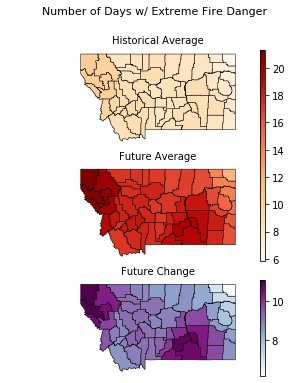

In [26]:
fig, axes = plt.subplots(nrows=3, sharex=True, figsize=(6,6))

# Caculate min and max values for colorbar
min_days = counties[['fm100_3p_mean_hist', 'fm100_3p_mean_diff']].min().min()
max_days = counties[['fm100_3p_mean_fut', 'fm100_3p_mean_diff']].max().max()

# Setup colorbar
norm = colors.Normalize(vmin=min_days, vmax=max_days)
cbar = plt.cm.ScalarMappable(norm=norm, cmap='OrRd')

# Create plot
counties = counties.to_crs(epsg=3857)
counties.plot(column='fm100_3p_mean_hist', ax=axes[0], legend=False, cmap='OrRd', vmin=min_days, vmax=max_days, edgecolor='k', linewidth=0.5)
counties.plot(column='fm100_3p_mean_fut', ax=axes[1], legend=False, cmap='OrRd', vmin=min_days, vmax=max_days, edgecolor='k', linewidth=0.5)
counties.plot(column='fm100_3p_mean_diff', ax=axes[2], legend=True, cmap='BuPu', edgecolor='k', linewidth=0.5)
fig.colorbar(cbar, ax=axes.ravel()[:2].tolist(), aspect=40)
axes[0].set_title("Historical Average", fontsize=10)
axes[0].axis('off')
axes[1].set_title("Future Average", fontsize=10)
axes[1].axis('off')
axes[2].set_title("Future Change", fontsize=10)
axes[2].axis('off')
fig.suptitle("          Number of Days w/ Extreme Fire Danger", fontsize=11, horizontalalignment='center')

Historical average from simulations and projected change in "Extreme" fire danger days (100 hour fuel moisture below 3 percentile) for Summer (Jun, Jul, and Aug). Future projected changes are based on the RCP 8.5 emission scenario for 2040-2069 and subtracted from historical simulations for 1971-2000. Estimates are the multi-model ensemble mean from 18 downscaled CMIP5 models. Data was downloaded from: https://climatetoolbox.org/tool/climate-mapper.

In [27]:
fig.savefig("extreme_fire_danger_days_hist_fut_comparison.png", bbox_inches="tight", dpi=300)